# Avacado Project
Problem Statement:
Avocado is a fruit consumed by people heavily in the United States. 

Content
This data was downloaded from the Hass Avocado Board website in May of 2018 & compiled into a single CSV. 

The table below represents weekly 2018 retail scan data for National retail volume (units) and price. Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados. 

Starting in 2013, the table below reflects an expanded, multi-outlet retail data set. Multi-outlet reporting includes an aggregation of the following channels: grocery, mass, club, drug, dollar and military. The Average Price (of avocados) in the table reflects a per unit (per avocado) cost, even when multiple units (avocados) are sold in bags. 

The Product Lookup codes (PLU’s) in the table are only for Hass avocados. Other varieties of avocados (e.g. greenskins) are not included in this table.



Some relevant columns in the dataset:

Date - The date of the observation

AveragePrice - the average price of a single avocado

type - conventional or organic

year - the year

Region - the city or region of the observation

Total Volume - Total number of avocados sold

4046 - Total number of avocados with PLU 4046 sold

4225 - Total number of avocados with PLU 4225 sold

4770 - Total number of avocados with PLU 4770 sold


In [64]:
#lets load the data set in our system 

In [65]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.metrics import accuracy_score
import seaborn as sns


In [66]:
df=pd.read_csv('avocado.csv')
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


In [67]:
## We want to change the index column from 'Unnamed: 0' to 'Date'
df_new=df.set_index('Date') # but we haven't changed the original dataset

In [68]:
df_new

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,,
2015-12-27,0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
2015-12-20,1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2015-12-13,2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
2015-12-06,3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
2015-11-29,4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-02-04,7,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
2018-01-28,8,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
2018-01-21,9,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico


# Data preprocessing

In [69]:
df = df.drop('Unnamed: 0', axis=1)

In [70]:
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


# EDA Process:
In choosing the right features to feed into our model, we want to capture the input variables most strongly related to the target variable.

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          18249 non-null  object 
 1   AveragePrice  18249 non-null  float64
 2   Total Volume  18249 non-null  float64
 3   4046          18249 non-null  float64
 4   4225          18249 non-null  float64
 5   4770          18249 non-null  float64
 6   Total Bags    18249 non-null  float64
 7   Small Bags    18249 non-null  float64
 8   Large Bags    18249 non-null  float64
 9   XLarge Bags   18249 non-null  float64
 10  type          18249 non-null  object 
 11  year          18249 non-null  int64  
 12  region        18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


observations:

1.from above code we can easily find that there is no nan values are fresent in dataset.

2.3 types of datatypes are present in the dataset.

3.we have to change the Date Datatypr from object to datatime datatype.

In [72]:
df.dtypes

Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

observations:

1.from above code we find that major variables are float64 and Date,type and year is  the object data type and year is int64 datatype.

In [73]:
df.shape

(18249, 13)

# visulization the Average price of organic and conventional avacado.

In [74]:
import plotly.express as px
#conventional = df[df['type'] == 'conventional']
#organic = df[df['type'] == 'organic']

fig = px.histogram(df, x='AveragePrice', color='type',
                   marginal='box', # or violin, rug
                   hover_data=df.columns)


fig.show()

observations:

    1.So, on average, organic avocados are more expensive (as expected).


# Label Encoder
we use labele Encoder for changing types of object data type to int datatype

In [75]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['type'] = le.fit_transform(df['type'])

# Univariate analysis
Univariate analysis is the simplest form of analyzing data.

In [76]:
#lets start with Distribution ploting.

<AxesSubplot:xlabel='Date'>

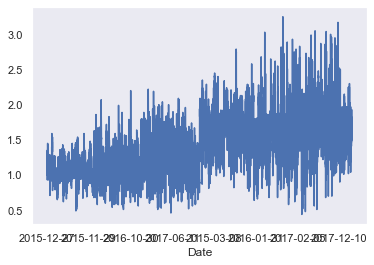

In [77]:
df_new['AveragePrice'].plot()

observations:

    1. prices are increases with years.
    
    2. prices are much lower in 2015 as compare to 2016,2017,2018

# Multivariate Analysis
Multivariate analysis is a set of techniques used for analysis of data sets that contain more than one variable



<AxesSubplot:xlabel='AveragePrice', ylabel='Total Volume'>

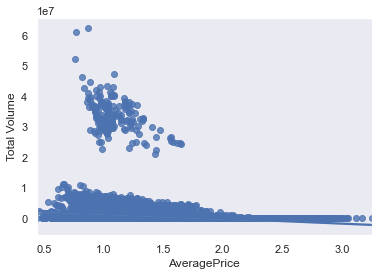

In [78]:

sns.regplot(y="Total Volume",x= "AveragePrice",data=df)

from above observation:

1. As Average prices increases Volume is Decreases. 

<AxesSubplot:xlabel='AveragePrice', ylabel='4046'>

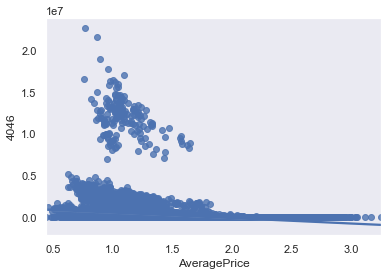

In [79]:
sns.regplot(y="4046",x= "AveragePrice",data=df)

from above observation:

1. As  Average prices increases 4046 is Decreases. 
2. Major data is fall between 0.5-2 price range.

<AxesSubplot:xlabel='AveragePrice', ylabel='4225'>

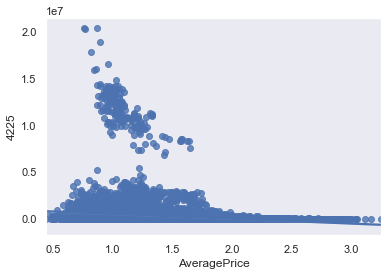

In [80]:
sns.regplot(y="4225",x= "AveragePrice",data=df)

observations:

    1. major price is between 0.5-2 .
    
    2. major avacados falls under this category.

<AxesSubplot:xlabel='AveragePrice', ylabel='4770'>

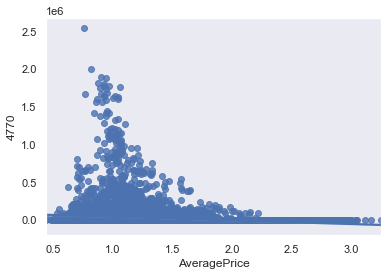

In [81]:
sns.regplot(y="4770",x= "AveragePrice",data=df)

In [82]:
observations:

    1. major price is between 0.5-2 .
    
    2. major avacados falls under this category.

SyntaxError: invalid syntax (<ipython-input-82-c7e54b322de7>, line 1)

In [ ]:
sns.regplot(y="Total Bags",x= "AveragePrice",data=df)

In [ ]:
observations:

    1. major price is between 0.5-2 .
    
    2. major avacados falls under this category.

In [ ]:
sns.regplot(y="Small Bags",x= "AveragePrice",data=df)

observations:

    1. major price is between 0.5-2 .
    
    2. major avacados falls under this category.

In [ ]:
sns.regplot(y="Large Bags",x= "AveragePrice",data=df)

observations:

    1. major price is between 0.5-2 .
    
    2. major avacados falls under this category.

In [ ]:
sns.regplot(y="XLarge Bags",x= "AveragePrice",data=df)

observations:

    1. major price is between 0.5-2 .
    
    2. major avacados falls under this category.

In [ ]:
sns.regplot(y="year",x= "AveragePrice",data=df)

Observation:
    1. prices increases in year 2016 and 2017 with respect to year 2015;and there is sharp decline in year 2018.
    
    2. average prices are low in year 2018.

<AxesSubplot:xlabel='year', ylabel='Total Volume'>

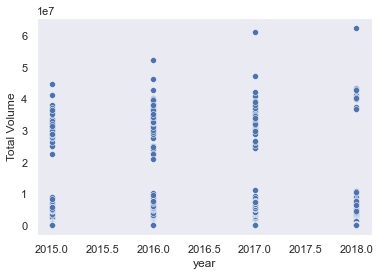

In [83]:
sns.scatterplot(y="Total Volume",x= "year",data=df)

observations:

    1. sales is declined in 2018 .
    
    2. major consuptions are in year 2016 and 2017.

<AxesSubplot:xlabel='region', ylabel='AveragePrice'>

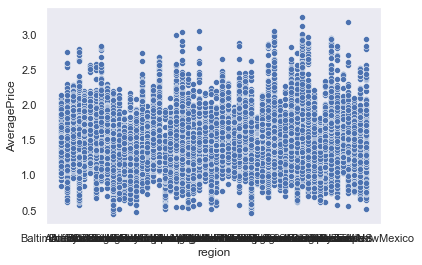

In [84]:
sns.scatterplot(x="region",y= "AveragePrice",data=df)

In [85]:
fig = px.box(df, x='region', y='AveragePrice')
fig.show()

observations:
    As expected region having great impact on average prices.

# CORRELATION BETWEEN THE COLUMNS:

In [86]:
df.corr()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year
AveragePrice,1.000000,-0.192752,-0.208317,-0.172928,-0.179446,-0.177088,-0.174730,-0.172940,-0.117592,0.615845,0.093197
Total Volume,-0.192752,1.000000,0.977863,0.974181,0.872202,0.963047,0.967238,0.880640,0.747157,-0.232434,0.017193
4046,-0.208317,0.977863,1.000000,0.926110,0.833389,0.920057,0.925280,0.838645,0.699377,-0.225819,0.003353
4225,-0.172928,0.974181,0.926110,1.000000,0.887855,0.905787,0.916031,0.810015,0.688809,-0.232289,-0.009559
4770,-0.179446,0.872202,0.833389,0.887855,1.000000,0.792314,0.802733,0.698471,0.679861,-0.210027,-0.036531
Total Bags,-0.177088,0.963047,0.920057,0.905787,0.792314,1.000000,0.994335,0.943009,0.804233,-0.217788,0.071552
Small Bags,-0.174730,0.967238,0.925280,0.916031,0.802733,0.994335,1.000000,0.902589,0.806845,-0.220535,0.063915
Large Bags,-0.172940,0.880640,0.838645,0.810015,0.698471,0.943009,0.902589,1.000000,0.710858,-0.193177,0.087891
XLarge Bags,-0.117592,0.747157,0.699377,0.688809,0.679861,0.804233,0.806845,0.710858,1.000000,-0.175483,0.081033
type,0.615845,-0.232434,-0.225819,-0.232289,-0.210027,-0.217788,-0.220535,-0.193177,-0.175483,1.000000,-0.000032


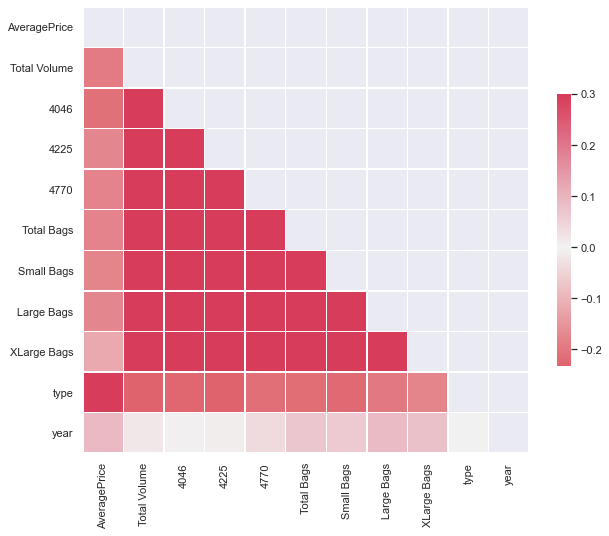

In [87]:
import matplotlib.pyplot as plt
import numpy as np
correlations = df.corr()
sns.set(style='dark')
cmap = sns.diverging_palette(10, 5, as_cmap=True)
mask = np.zeros_like(correlations, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(10,10))
sns.heatmap(correlations, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

<AxesSubplot:>

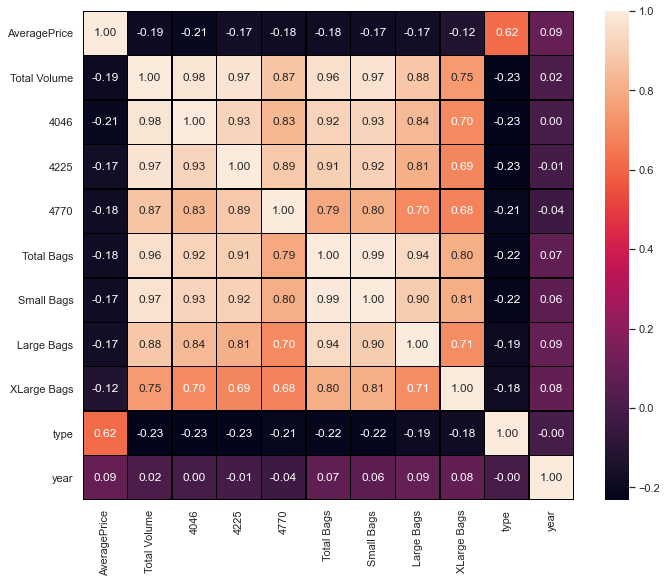

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(11,9))
sns.heatmap(df.corr(), annot=True, linewidths=0.5,linecolor="black", fmt= '.2f')

# Correlation: From the above result it is clear that some columns making positive correlation and some making negative correlation.


Positive correlation columns are:
type,year
Total Volume,	4046	,4225	,4770	,Total Bags,	Small Bags	,Large Bags	,XLarge Bags	

Negative correlation columns are:
Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags

The positively correlated columns has a great impact on the target column while the negative correlated has less or zero impact on the target column.

# Discription of dataset

In [89]:
df.describe()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year
count,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000
mean,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,0.499918,2016.147899
std,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.500014,0.939938
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,2015.000000
25%,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,0.000000,2015.000000
50%,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,0.000000,2016.000000
75%,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,1.000000,2017.000000
max,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,1.000000,2018.000000


PLOTTING THE DISCRIPTION OF DATASET

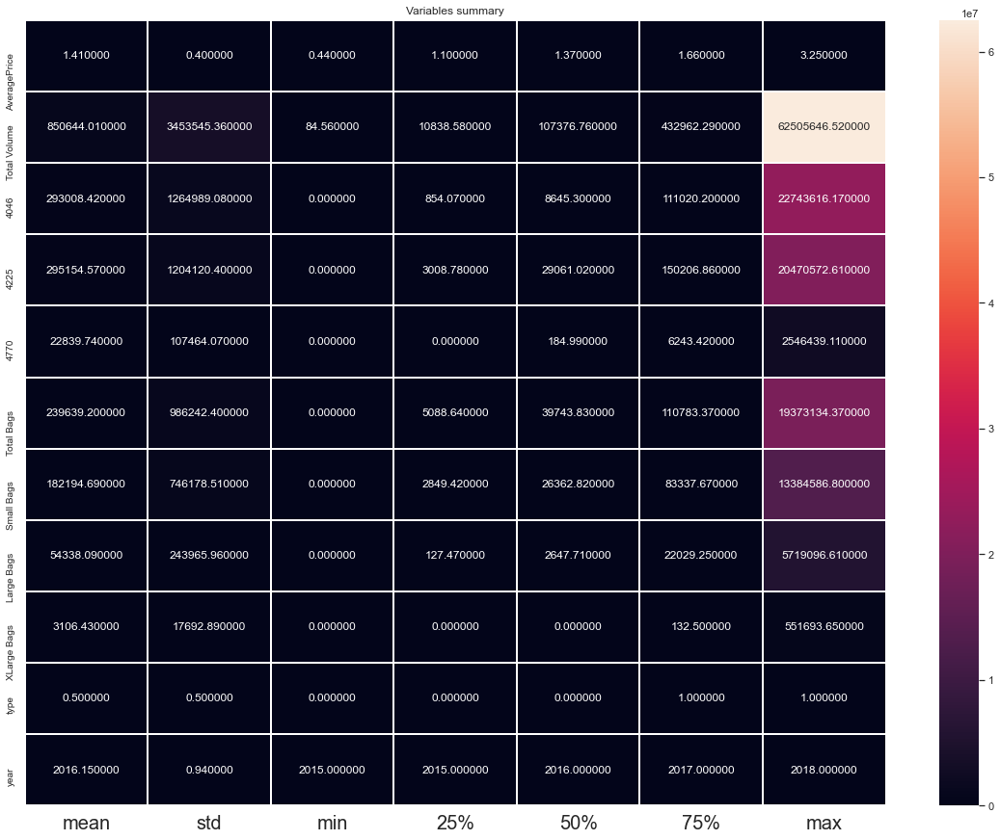

In [90]:
plt.figure(figsize=(20,15))
sns.heatmap(round(df.describe()[1:].transpose(),2),linewidth=1,annot=True,fmt="f")
plt.xticks(fontsize=20)
plt.yticks(fontsize=10)
plt.title("Variables summary")
plt.show()


# From above ploting we can easily look at mean,std-deviation,min and max values of each columns,it helps in futher data cleaning.


In [91]:
df

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,0,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,0,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,0,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,0,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,0,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,1,2018,WestTexNewMexico
18245,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,1,2018,WestTexNewMexico
18246,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,1,2018,WestTexNewMexico
18247,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,1,2018,WestTexNewMexico


# Label Encode the following Features:
    

In [92]:
df['region'] = le.fit_transform(df['region'])
df['year']=le.fit_transform(df['year'])

# Principal component analysis
Principal component analysis (PCA) is the process of computing the principal components.
and cheak the collinearity.

In [93]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [94]:
x=df.iloc[:,2:]
x

,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,0,0,0
1,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,0,0,0
2,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,0,0,0
3,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,0,0,0
4,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
18244,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,1,3,53
18245,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,1,3,53
18246,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,1,3,53
18247,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,1,3,53


In [95]:
y=df.iloc[:,1]
y

0        1.33
1        1.35
2        0.93
3        1.08
4        1.28
         ... 
18244    1.63
18245    1.71
18246    1.87
18247    1.93
18248    1.62
Name: AveragePrice, Length: 18249, dtype: float64

In [96]:
def vif_calc():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)

In [97]:
vif_calc()

      VIF Factor      features
0   5.218092e+09  Total Volume
1   6.954550e+08          4046
2   6.339859e+08          4225
3   4.978784e+06          4770
4   2.502000e+14    Total Bags
5   1.429714e+14    Small Bags
6   1.521486e+13    Large Bags
7   7.855778e+10   XLarge Bags
8   1.787467e+00          type
9   1.982500e+00          year
10  2.371649e+00        region


Observations:

4046,4225 are highy corelated 


and 4046= -.21,4225 = -.17 

from above observations we can easily drop 4225

In [98]:
df.drop(['Date','4225'],axis=1,inplace=True)

In [99]:
df

,AveragePrice,Total Volume,4046,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,1.33,64236.62,1036.74,48.16,8696.87,8603.62,93.25,0.0,0,0,0
1,1.35,54876.98,674.28,58.33,9505.56,9408.07,97.49,0.0,0,0,0
2,0.93,118220.22,794.70,130.50,8145.35,8042.21,103.14,0.0,0,0,0
3,1.08,78992.15,1132.00,72.58,5811.16,5677.40,133.76,0.0,0,0,0
4,1.28,51039.60,941.48,75.78,6183.95,5986.26,197.69,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,0.00,13498.67,13066.82,431.85,0.0,1,3,53
18245,1.71,13888.04,1191.70,0.00,9264.84,8940.04,324.80,0.0,1,3,53
18246,1.87,13766.76,1191.92,727.94,9394.11,9351.80,42.31,0.0,1,3,53
18247,1.93,16205.22,1527.63,727.01,10969.54,10919.54,50.00,0.0,1,3,53


# Now use subplot and displot to check data are normalised or not.

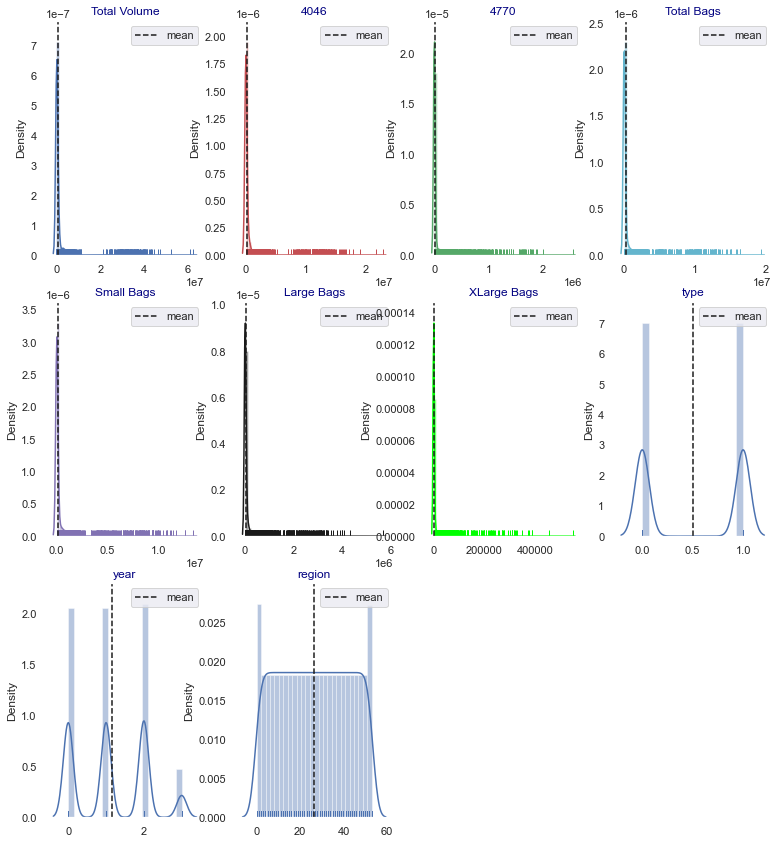

In [112]:
import itertools
import matplotlib.pyplot as plt
cols = ['Total Volume', '4046', '4770', 'Total Bags',
       'Small Bags', 'Large Bags', 'XLarge Bags', 'type', 'year', 'region']
length = len(cols)
cs = ["b","r","g","c","m","k","lime"]
fig = plt.figure(figsize=(13,25))

for i,j,k in itertools.zip_longest(cols,range(length),cs):
    plt.subplot(5,4,j+1)
    ax = sns.distplot(df[i],color=k,rug=True)
    ax.set_facecolor("w")
    plt.axvline(df[i].mean(),linestyle="dashed",label="mean",color="k")
    plt.legend(loc="best")
    plt.title(i,color="navy")
    plt.xlabel("")

Observations: all the numeric features are skewed to the right. Let's examine outliers with the use of boxplots.

array([[<AxesSubplot:title={'center':'AveragePrice'}>,
        <AxesSubplot:title={'center':'Total Volume'}>,
        <AxesSubplot:title={'center':'4046'}>],
       [<AxesSubplot:title={'center':'4770'}>,
        <AxesSubplot:title={'center':'Total Bags'}>,
        <AxesSubplot:title={'center':'Small Bags'}>],
       [<AxesSubplot:title={'center':'Large Bags'}>,
        <AxesSubplot:title={'center':'XLarge Bags'}>,
        <AxesSubplot:title={'center':'type'}>],
       [<AxesSubplot:title={'center':'year'}>,
        <AxesSubplot:title={'center':'region'}>, <AxesSubplot:>]],
      dtype=object)

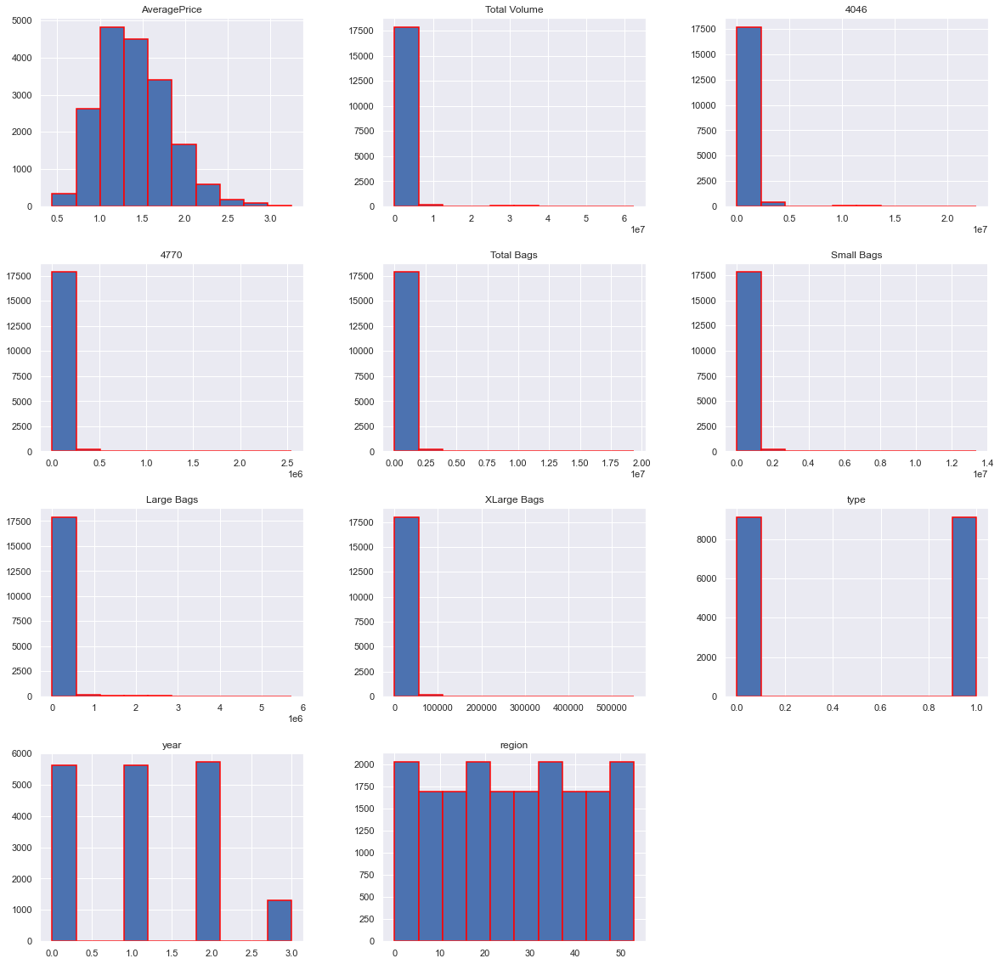

In [113]:
df.hist(edgecolor='red',linewidth=1.5,figsize=(20,20))

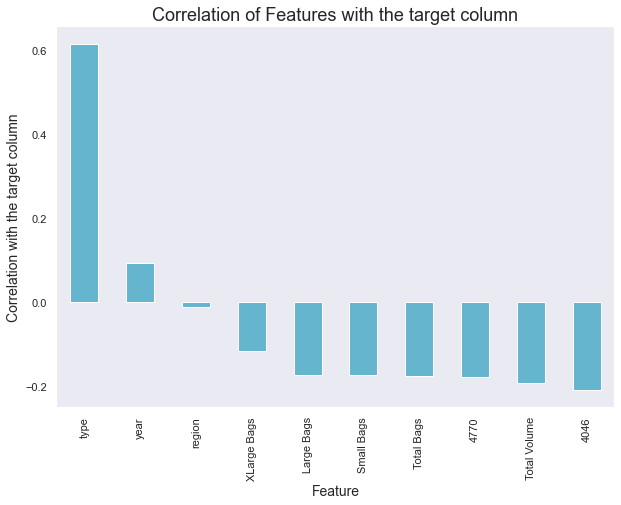

In [114]:
plt.figure(figsize=(10,7))
df.corr()['AveragePrice'].sort_values(ascending=False).drop(['AveragePrice']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Correlation with the target column',fontsize=14)
plt.title('Correlation of Features with the target column',fontsize=18)
plt.show()


observations:

    1. type and year are having only positive relation with target columns.
    
    2. rest all the feature column having negative relation with target column.

# Skeness in columns

In [115]:
df.skew()

AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
type             0.000329
year             0.215339
region           0.000030
dtype: float64

observations:

    1. from above plotting we find that all the numeric data is skewed towards right;hence we have to make data normally distributed.

# Detecting outliers

<AxesSubplot:>

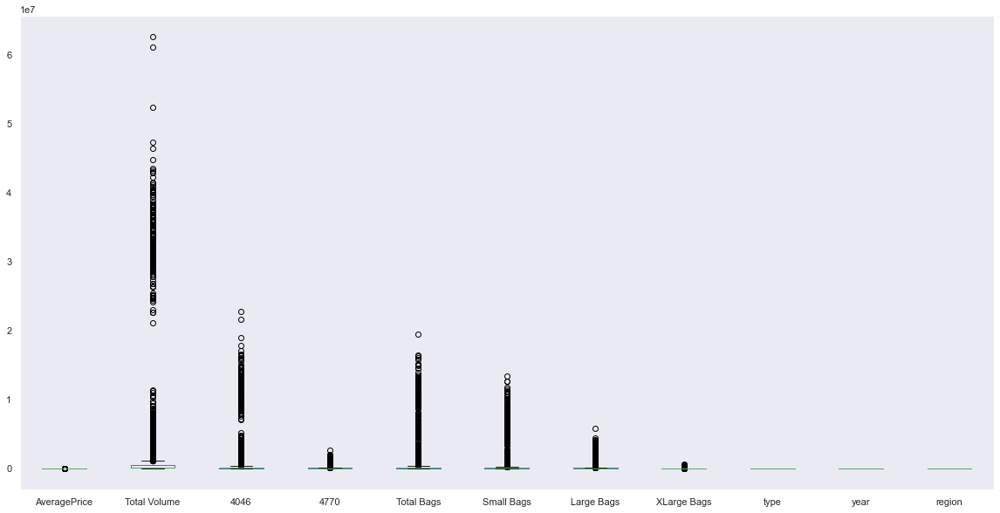

In [116]:
df.plot.box(figsize=(20,10))

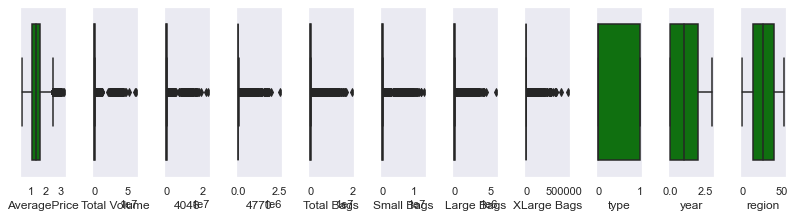

In [117]:
collist=df.columns.values
ncol=30
nrows=30
plt.figure(figsize=(ncol,3*(ncol)))
for i in range (0, len(collist)):
    plt.subplot(nrows,ncol,i+5)
    sns.boxplot(df[collist[i]],color='green')
    plt.tight_layout()


observations:
    
    1.except type,year and region all the feature column having outliers.

# Check the percentage of data falls under outliers:

In [118]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([  346,   359,   780, ..., 17304, 17402, 17428], dtype=int64),
 array([2, 2, 7, ..., 0, 0, 0], dtype=int64))

In [119]:
df_new=df[(z<3).all(axis=1)]
df_new

,AveragePrice,Total Volume,4046,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,1.33,64236.62,1036.74,48.16,8696.87,8603.62,93.25,0.0,0,0,0
1,1.35,54876.98,674.28,58.33,9505.56,9408.07,97.49,0.0,0,0,0
2,0.93,118220.22,794.70,130.50,8145.35,8042.21,103.14,0.0,0,0,0
3,1.08,78992.15,1132.00,72.58,5811.16,5677.40,133.76,0.0,0,0,0
4,1.28,51039.60,941.48,75.78,6183.95,5986.26,197.69,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,0.00,13498.67,13066.82,431.85,0.0,1,3,53
18245,1.71,13888.04,1191.70,0.00,9264.84,8940.04,324.80,0.0,1,3,53
18246,1.87,13766.76,1191.92,727.94,9394.11,9351.80,42.31,0.0,1,3,53
18247,1.93,16205.22,1527.63,727.01,10969.54,10919.54,50.00,0.0,1,3,53


In [120]:
df.shape

(18249, 11)

In [121]:
df_new.shape

(17659, 11)

In [122]:
percentage_loss=((18249-17659)/18249)*100
print(percentage_loss)

3.233053865965258


observations:

1.The data loss is 3.23 percentile,which is under 10%  so we go for further data cleaning.  



In [123]:
df_new.shape

(17659, 11)

In [124]:
x=df_new.iloc[:,1:]
x

,Total Volume,4046,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,64236.62,1036.74,48.16,8696.87,8603.62,93.25,0.0,0,0,0
1,54876.98,674.28,58.33,9505.56,9408.07,97.49,0.0,0,0,0
2,118220.22,794.70,130.50,8145.35,8042.21,103.14,0.0,0,0,0
3,78992.15,1132.00,72.58,5811.16,5677.40,133.76,0.0,0,0,0
4,51039.60,941.48,75.78,6183.95,5986.26,197.69,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
18244,17074.83,2046.96,0.00,13498.67,13066.82,431.85,0.0,1,3,53
18245,13888.04,1191.70,0.00,9264.84,8940.04,324.80,0.0,1,3,53
18246,13766.76,1191.92,727.94,9394.11,9351.80,42.31,0.0,1,3,53
18247,16205.22,1527.63,727.01,10969.54,10919.54,50.00,0.0,1,3,53


In [125]:
y=df_new.iloc[:,0]
y

0        1.33
1        1.35
2        0.93
3        1.08
4        1.28
         ... 
18244    1.63
18245    1.71
18246    1.87
18247    1.93
18248    1.62
Name: AveragePrice, Length: 17659, dtype: float64

# Removing skewness by transforming data.

In [126]:
from sklearn.preprocessing import power_transform
x=power_transform(x,method='yeo-johnson')
x

array([[-0.07589217, -0.65798186, -0.2233401 , ..., -1.01857673,
        -1.29889065, -2.01067832],
       [-0.14801763, -0.7777103 , -0.1760085 , ..., -1.01857673,
        -1.29889065, -2.01067832],
       [ 0.20476987, -0.73231985,  0.02310389, ..., -1.01857673,
        -1.29889065, -2.01067832],
       ...,
       [-0.77551201, -0.61853615,  0.44489242, ...,  0.98176207,
         1.70088065,  1.57870888],
       [-0.70205572, -0.54759439,  0.44458135, ...,  0.98176207,
         1.70088065,  1.57870888],
       [-0.66765003, -0.36028215,  0.15693819, ...,  0.98176207,
         1.70088065,  1.57870888]])

In [127]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-0.07589217, -0.65798186, -0.2233401 , ..., -1.01857673,
        -1.29889065, -2.01067832],
       [-0.14801763, -0.7777103 , -0.1760085 , ..., -1.01857673,
        -1.29889065, -2.01067832],
       [ 0.20476987, -0.73231985,  0.02310389, ..., -1.01857673,
        -1.29889065, -2.01067832],
       ...,
       [-0.77551201, -0.61853615,  0.44489242, ...,  0.98176207,
         1.70088065,  1.57870888],
       [-0.70205572, -0.54759439,  0.44458135, ...,  0.98176207,
         1.70088065,  1.57870888],
       [-0.66765003, -0.36028215,  0.15693819, ...,  0.98176207,
         1.70088065,  1.57870888]])

# Since the target column has continous data type we will use Linear Regression model.

# Regressor Model Building:


# Linear Regression:

In [128]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
lr=LinearRegression()

In [129]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score


In [130]:
max_scr=0
for i in range(0,1000):
    xtrain,xtest,ytrain,ytest=train_test_split(x,y,random_state=i,test_size=0.20)
    lr.fit(xtrain,ytrain)
    pred_train=lr.predict(xtrain)
    pred_test=lr.predict(xtest)
    if round(r2_score(ytrain,pred_train)*100,2)==round(r2_score(ytest,pred_test)*100,2):
        print("At random state",i," The model performs very well")
        print("At random_state:-",i)
        print("Training r2_score is:-", r2_score(ytrain,pred_train)*100)
        print("Testing r2_score is:-", r2_score(ytest,pred_test)*100)

At random state 362  The model performs very well
At random_state:- 362
Training r2_score is:- 48.69029585295894
Testing r2_score is:- 48.68873559079899
At random state 425  The model performs very well
At random_state:- 425
Training r2_score is:- 48.68654437608401
Testing r2_score is:- 48.69285105994412
At random state 857  The model performs very well
At random_state:- 857
Training r2_score is:- 48.691958528595556
Testing r2_score is:- 48.68996182018807


In [131]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=.20,random_state=425)

In [132]:


lr=LinearRegression()
lr.fit(xtrain,ytrain)
lr.score(xtrain,ytrain)

pred_test=lr.predict(xtest)

from sklearn.metrics import accuracy_score
r2_score(ytest,pred_test)


0.4869285105994412

In [133]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')

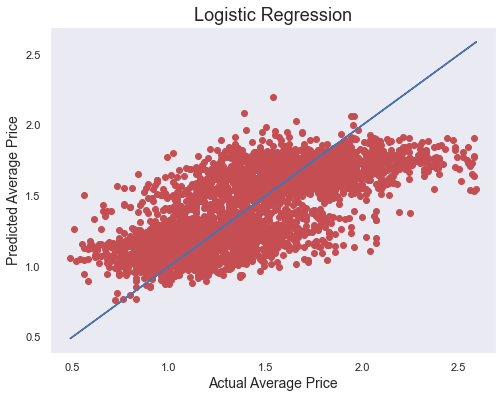

In [134]:
plt.figure(figsize=(8,6))
plt.scatter(x=ytest, y=pred_test, color='r')
plt.plot(ytest,ytest, color='b')
plt.xlabel('Actual Average Price',fontsize=14)
plt.ylabel('Predicted Average Price',fontsize=14)
plt.title('Logistic Regression',fontsize=18)
plt.show()

# Regurlarization
As we can easily analyis that data is not correctely fit in our model lets do some regurlization.

# 1. Lasso

In [158]:
from sklearn.linear_model import Lasso

parameters = {'alpha':[.0001, .001, .01, .1, 1, 10],'random_state':list(range(0,10))}
ls = Lasso()
clf = GridSearchCV(ls,parameters)
clf.fit(xtrain,ytrain)

print(clf.best_params_)

{'alpha': 0.0001, 'random_state': 0}


In [161]:
ls = Lasso(alpha=0.0001,random_state=0)
ls.fit(xtrain,ytrain)
ls.score(xtrain,ytrain)
pred_ls = ls.predict(xtest)

lss = r2_score(ytest,pred_ls)
for j in range(2,10):
    lsscore = cross_val_score(ls,x,y,cv=j)
    lsc = lsscore.mean() 
    print("At cv:-",j)
    print("Cross validation score is:-",lsc*100 )
    print("R2_score is :-",lss*100)
    print("\n")

At cv:- 2
Cross validation score is:- -339.1871323625692
R2_score is :- 48.687105662070195


At cv:- 3
Cross validation score is:- -0.7060643394826223
R2_score is :- 48.687105662070195


At cv:- 4
Cross validation score is:- -1.3541942916387635
R2_score is :- 48.687105662070195


At cv:- 5
Cross validation score is:- 8.115293069302636
R2_score is :- 48.687105662070195


At cv:- 6
Cross validation score is:- 1.5250890949666676
R2_score is :- 48.687105662070195


At cv:- 7
Cross validation score is:- 5.298102931275869
R2_score is :- 48.687105662070195


At cv:- 8
Cross validation score is:- 4.741406882427185
R2_score is :- 48.687105662070195


At cv:- 9
Cross validation score is:- 5.94772691497546
R2_score is :- 48.687105662070195




At cv:- 9
Cross validation score is:- 5.94772691497546
R2_score is :- 48.687105662070195

In [162]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import numpy as np

In [163]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(ytest,pred_ls))
print('Mean Squared Error:',mean_squared_error(ytest,pred_ls))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(ytest,pred_ls)))

Error:
Mean Absolute Error: 0.21676789834539142
Mean Squared Error: 0.07552807086249834
Root Mean Square Error: 0.27482370869795486


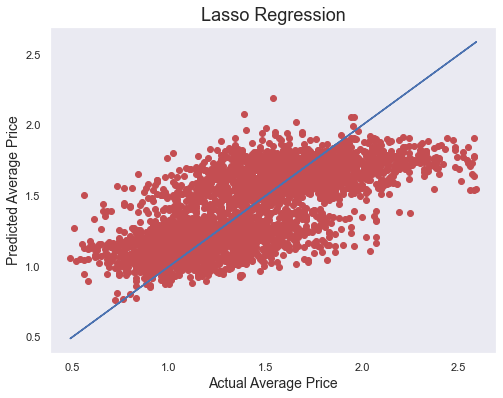

In [164]:
plt.figure(figsize=(8,6))
plt.scatter(x=ytest, y=pred_ls, color='r')
plt.plot(ytest,ytest, color='b')
plt.xlabel('Actual Average Price',fontsize=14)
plt.ylabel('Predicted Average Price',fontsize=14)
plt.title('Lasso Regression',fontsize=18)
plt.show()

# 2. Ridge

In [165]:
from sklearn.linear_model import Ridge

parameters = {'alpha':[.0001, .001, .01, .1, 1],'fit_intercept':[True,False],'normalize':[True,False],'copy_X':[True,False],'tol':[0.001,0.01,0.1],'random_state':[0,1,2,3,4,5,6,7,8,9]}
rd = Ridge()
clf = GridSearchCV(rd,parameters)
clf.fit(xtrain,ytrain)

print(clf.best_params_)

{'alpha': 0.0001, 'copy_X': True, 'fit_intercept': True, 'normalize': True, 'random_state': 0, 'tol': 0.001}


In [167]:
rd = Ridge(alpha=0.0001, copy_X= True, fit_intercept= True, normalize=True, random_state= 0, tol= 0.001)
rd.fit(xtrain,ytrain)
rd.score(xtrain,ytrain)
pred_rd = rd.predict(xtest)
rds = r2_score(ytest,pred_rd)
for j in range(10,20):
    rds = r2_score(ytest,pred_rd)
    
    print("At cv:-",j)
    print('R2 Score:',rds*100)

    rdscore = cross_val_score(rd,x,y,cv=j)
    rdc = rdscore.mean() 
    print('Cross Val Score:',rdc*100)

At cv:- 10
R2 Score: 48.69207662810583
Cross Val Score: 4.265159654014826
At cv:- 11
R2 Score: 48.69207662810583
Cross Val Score: 4.665131939961769
At cv:- 12
R2 Score: 48.69207662810583
Cross Val Score: 4.953526207772615
At cv:- 13
R2 Score: 48.69207662810583
Cross Val Score: 6.0156660458441955
At cv:- 14
R2 Score: 48.69207662810583
Cross Val Score: 3.6125964322676625
At cv:- 15
R2 Score: 48.69207662810583
Cross Val Score: 5.067889644886632
At cv:- 16
R2 Score: 48.69207662810583
Cross Val Score: 4.780525733693706
At cv:- 17
R2 Score: 48.69207662810583
Cross Val Score: 3.5334960694669295
At cv:- 18
R2 Score: 48.69207662810583
Cross Val Score: 4.969009225319867
At cv:- 19
R2 Score: 48.69207662810583
Cross Val Score: 5.322461533456049


At cv:- 19
R2 Score: 48.69207662810583
Cross Val Score: 5.322461533456049

In [169]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(ytest,pred_rd))
print('Mean Squared Error:',mean_squared_error(ytest,pred_rd))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(ytest,pred_rd)))

Error:
Mean Absolute Error: 0.216757975736837
Mean Squared Error: 0.07552075403736425
Root Mean Square Error: 0.2748103965234289


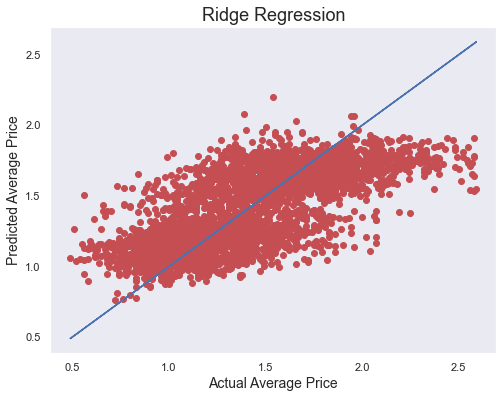

In [223]:
plt.figure(figsize=(8,6))
plt.scatter(x=ytest, y=pred_rd, color='r')
plt.plot(ytest,ytest, color='b')
plt.xlabel('Actual Average Price',fontsize=14)
plt.ylabel('Predicted Average Price',fontsize=14)
plt.title('Ridge Regression',fontsize=18)
plt.show()

# Ensemble Techniques:
Decision Tree Regressor

In [171]:
from sklearn.tree import DecisionTreeRegressor

parameters = {'criterion':['mse', 'friedman_mse', 'mae'], 'splitter':['best', 'random'], 'max_features': ['auto', 'sqrt', 'log2']}
dt =DecisionTreeRegressor()
clf = GridSearchCV(dt,parameters)
clf.fit(xtrain,ytrain)

print(clf.best_params_)

{'criterion': 'friedman_mse', 'max_features': 'auto', 'splitter': 'best'}


In [172]:
dt = DecisionTreeRegressor(criterion='friedman_mse', splitter='best',max_features= 'auto')
dt.fit(xtrain,ytrain)
dt.score(xtrain,ytrain)
pred_decision = dt.predict(xtest)

dts = r2_score(ytest,pred_decision)
for j in range(2,10):
    print("At cv:-",j)
    dts = r2_score(ytest,pred_decision)
    print('R2 Score:',dts*100)

    dtscore = cross_val_score(dt,x,y,cv=j)
    dtc = dtscore.mean() 
    print('Cross Val Score:',dtc*100)

At cv:- 2
R2 Score: 68.01271351754863
Cross Val Score: -207.28043348671466
At cv:- 3
R2 Score: 68.01271351754863
Cross Val Score: -42.993012644258094
At cv:- 4
R2 Score: 68.01271351754863
Cross Val Score: -52.19794457745201
At cv:- 5
R2 Score: 68.01271351754863
Cross Val Score: -37.97465890264705
At cv:- 6
R2 Score: 68.01271351754863
Cross Val Score: -57.39119410986713
At cv:- 7
R2 Score: 68.01271351754863
Cross Val Score: -45.92922457869986
At cv:- 8
R2 Score: 68.01271351754863
Cross Val Score: -39.05538565028039
At cv:- 9
R2 Score: 68.01271351754863
Cross Val Score: -30.244423856432533


At cv:- 9
R2 Score: 68.01271351754863
Cross Val Score: -30.244423856432533

In [173]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(ytest,pred_decision))
print('Mean Squared Error:',mean_squared_error(ytest,pred_decision))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(ytest,pred_decision)))

Error:
Mean Absolute Error: 0.14415345413363534
Mean Squared Error: 0.047082474518686294
Root Mean Square Error: 0.2169849638078323


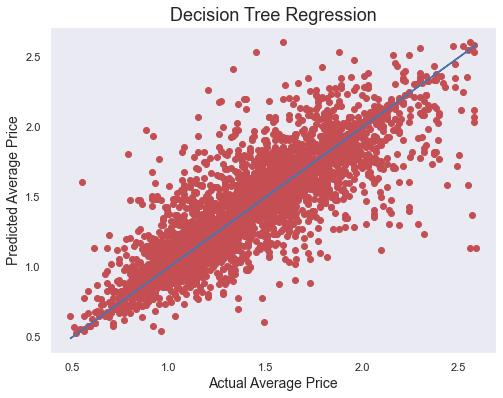

In [224]:
plt.figure(figsize=(8,6))
plt.scatter(x=ytest, y=pred_decision, color='r')
plt.plot(ytest,ytest, color='b')
plt.xlabel('Actual Average Price',fontsize=14)
plt.ylabel('Predicted Average Price',fontsize=14)
plt.title('Decision Tree Regression',fontsize=18)
plt.show()

# Gradient Boosting Regressor

In [176]:
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
parameters = {'loss' : ['ls', 'lad', 'huber', 'quantile'],'n_estimators':[50,100,200],'criterion':['friedman_mse', 'mse']}
gbr=GradientBoostingRegressor()
clf = GridSearchCV(gbr,parameters)
clf.fit(xtrain,ytrain)

print(clf.best_params_)

{'criterion': 'mse', 'loss': 'ls', 'n_estimators': 200}


In [178]:
gbr= GradientBoostingRegressor(criterion='mse',loss='ls',n_estimators=200)
gbr.fit(xtrain, ytrain)
gbr.score(xtrain, ytrain)
pred_gradient = gbr.predict(xtest)

for j in range(10,20):
    print("At cv:-",j)

    gbrs= r2_score(ytest,pred_gradient)
    print('R2 Score:',gbrs*100)

    gbscore = cross_val_score(gbr,x,y,cv=j)
    gbrc= gbscore.mean() 
    print('Cross Val Score:',gbrc*100)

At cv:- 10
R2 Score: 71.39515649669141
Cross Val Score: 36.10010034312824
At cv:- 11
R2 Score: 71.39515649669141
Cross Val Score: 36.780819601756434
At cv:- 12
R2 Score: 71.39515649669141
Cross Val Score: 37.78134212502835
At cv:- 13
R2 Score: 71.39515649669141
Cross Val Score: 40.53056098039406
At cv:- 14
R2 Score: 71.39515649669141
Cross Val Score: 37.85124092599919
At cv:- 15
R2 Score: 71.39515649669141
Cross Val Score: 39.05163600702339
At cv:- 16
R2 Score: 71.39515649669141
Cross Val Score: 38.71379743075797
At cv:- 17
R2 Score: 71.39515649669141
Cross Val Score: 38.78830227289218
At cv:- 18
R2 Score: 71.39515649669141
Cross Val Score: 37.7411878281729
At cv:- 19
R2 Score: 71.39515649669141
Cross Val Score: 39.177086249837316


At cv:- 13
R2 Score: 71.39515649669141
Cross Val Score: 40.53056098039406

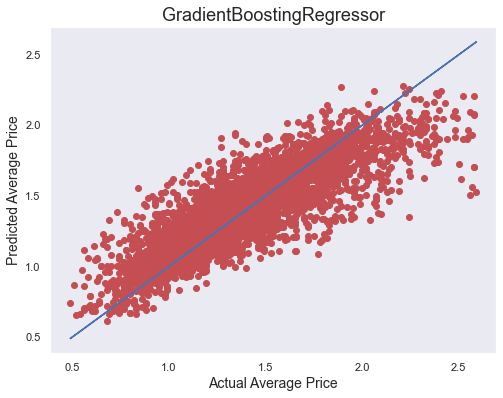

In [225]:
plt.figure(figsize=(8,6))
plt.scatter(x=ytest, y=pred_gradient, color='r')
plt.plot(ytest,ytest, color='b')
plt.xlabel('Actual Average Price',fontsize=14)
plt.ylabel('Predicted Average Price',fontsize=14)
plt.title('GradientBoostingRegressor',fontsize=18)
plt.show()

# KNeighborsRegressor

In [169]:
from sklearn.neighbors import KNeighborsRegressor
kn = KNeighborsRegressor()

In [182]:
from sklearn.neighbors import KNeighborsRegressor

parameters = { 'weights':['uniform', 'distance'] ,'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],'n_neighbors':[5,10,15,20,25]}
kn = KNeighborsRegressor()
clf = GridSearchCV(kn,parameters)
clf.fit(xtrain,ytrain)

print(clf.best_params_)

{'algorithm': 'auto', 'n_neighbors': 5, 'weights': 'distance'}


In [187]:
kn = KNeighborsRegressor(algorithm = 'auto', weights = 'distance',n_neighbors=5)
kn.fit(xtrain,ytrain)
kn.score(xtrain,ytrain)
pred_k = kn.predict(xtest)

for j in range(20,30):
    print("At cv:-",j)


    kns = r2_score(ytest,pred_k)
    print('R2 Score:',kns*100)

    knscore = cross_val_score(kn,x,y,cv=j)
    kvc = knscore.mean() 
    print('Cross Val Score:',kvc*2)

At cv:- 20
R2 Score: 83.878521178605
Cross Val Score: -0.1021233959629733
At cv:- 21
R2 Score: 83.878521178605
Cross Val Score: -0.06946387269982263
At cv:- 22
R2 Score: 83.878521178605
Cross Val Score: -0.12273638251922823
At cv:- 23
R2 Score: 83.878521178605
Cross Val Score: -0.05017617635176852
At cv:- 24
R2 Score: 83.878521178605
Cross Val Score: -0.11394792301092142
At cv:- 25
R2 Score: 83.878521178605
Cross Val Score: -0.06522891305561958
At cv:- 26
R2 Score: 83.878521178605
Cross Val Score: 0.02731541492442132
At cv:- 27
R2 Score: 83.878521178605
Cross Val Score: -0.1181542103470626
At cv:- 28
R2 Score: 83.878521178605
Cross Val Score: -0.18702184366570493
At cv:- 29
R2 Score: 83.878521178605
Cross Val Score: -0.09618226684677902


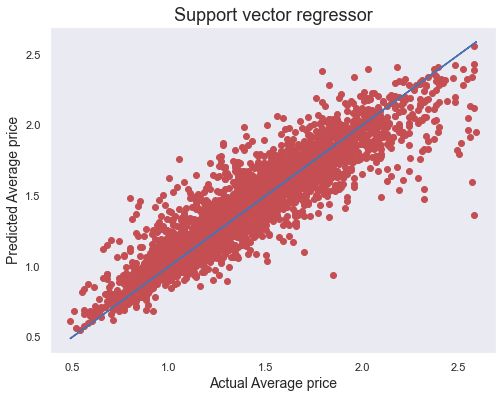

In [188]:
plt.figure(figsize=(8,6))
plt.scatter(x=ytest, y=pred_k, color='r')
plt.plot(ytest,ytest, color='b')
plt.xlabel('Actual Average price',fontsize=14)
plt.ylabel('Predicted Average price',fontsize=14)
plt.title('Support vector regressor',fontsize=18)
plt.show()


# We tested 5 models out of which k-Neighbour Regression performing Best as Accuracy score is best from the above tested models¶

In [ ]:
Conclusion

In [163]:
import numpy as np
a=np.array(ytest)
a

array([1.87, 1.33, 1.83, ..., 1.46, 1.55, 1.08])

In [164]:
predicted=np.array(pred_test)
predicted

array([1, 1, 1, ..., 1, 1, 1])

In [166]:
df_com=pd.DataFrame({"original":a,"predicted":predicted}, index= range(len(a)))
df_com

,original,predicted
0,1.87,1
1,1.33,1
2,1.83,1
3,1.78,0
4,1.43,0
...,...,...
3527,1.37,0
3528,1.07,1
3529,1.46,1
3530,1.55,1


# Our Model performs with Accuracy 83.35%...

Saving the best models with initials...using pickle library

In [170]:
import pickle
filename = 'avacado_price_prediction.pkl'
pickle.dump(kn, open(filename, 'wb'))

# Lets make predict the type of avacoda weather it is conventionalor organic type.

In [137]:
df_new

,AveragePrice,Total Volume,4046,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,1.33,64236.62,1036.74,48.16,8696.87,8603.62,93.25,0.0,0,0,0
1,1.35,54876.98,674.28,58.33,9505.56,9408.07,97.49,0.0,0,0,0
2,0.93,118220.22,794.70,130.50,8145.35,8042.21,103.14,0.0,0,0,0
3,1.08,78992.15,1132.00,72.58,5811.16,5677.40,133.76,0.0,0,0,0
4,1.28,51039.60,941.48,75.78,6183.95,5986.26,197.69,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
18244,1.63,17074.83,2046.96,0.00,13498.67,13066.82,431.85,0.0,1,3,53
18245,1.71,13888.04,1191.70,0.00,9264.84,8940.04,324.80,0.0,1,3,53
18246,1.87,13766.76,1191.92,727.94,9394.11,9351.80,42.31,0.0,1,3,53
18247,1.93,16205.22,1527.63,727.01,10969.54,10919.54,50.00,0.0,1,3,53


In [139]:
x=df_new.drop(['type'],axis=1)

In [140]:
y=df_new['type']

# Logistic Regression:

In [141]:
df.type.value_counts()

0    9126
1    9123
Name: type, dtype: int64

In [142]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


lr=LogisticRegression()
from sklearn.metrics import accuracy_score

In [144]:
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if round(accuracy_score(y_train,pred_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("At random state",i," The model performs very well")
        print("At random_state:-",i)
        print("Training accuracy_score is:-", accuracy_score(y_train,pred_train)*100)
        print("Testing accuracy_score is:-", accuracy_score(y_test,pred_test)*100)

At random state 1  The model performs very well
At random_state:- 1
Training accuracy_score is:- 92.6523678063283
Testing accuracy_score is:- 92.66704416761043
At random state 6  The model performs very well
At random_state:- 6
Training accuracy_score is:- 92.59573865647342
Testing accuracy_score is:- 92.61041902604757
At random state 11  The model performs very well
At random_state:- 11
Training accuracy_score is:- 92.60989594393713
Testing accuracy_score is:- 92.63873159682899
At random state 18  The model performs very well
At random_state:- 18
Training accuracy_score is:- 92.57450272527784
Testing accuracy_score is:- 92.63873159682899
At random state 22  The model performs very well
At random_state:- 22
Training accuracy_score is:- 92.56034543781412
Testing accuracy_score is:- 92.63873159682899
At random state 42  The model performs very well
At random_state:- 42
Training accuracy_score is:- 92.58866001274157
Testing accuracy_score is:- 92.63873159682899
At random state 44  The mod

In [145]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=71,test_size=0.20)

In [146]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=849,test_size=0.20)
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr.score(x_train,y_train)

pred_test=lr.predict(x_test)

from sklearn.metrics import accuracy_score
accuracy_score(y_test,pred_test)

0.9328992072480181

In [147]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y_test,pred_test))
print('Mean Squared Error:',mean_squared_error(y_test,pred_test))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y_test,pred_test)))


Error:
Mean Absolute Error: 0.06710079275198189
Mean Squared Error: 0.06710079275198189
Root Mean Square Error: 0.25903820712779396


In [148]:
from sklearn.metrics import classification_report
print(classification_report(y_test,pred_test))

              precision    recall  f1-score   support

           0       0.96      0.91      0.93      1738
           1       0.91      0.96      0.94      1794

    accuracy                           0.93      3532
   macro avg       0.93      0.93      0.93      3532
weighted avg       0.93      0.93      0.93      3532



In [149]:
pred_lr=lr.predict(x_test)
from sklearn.model_selection import cross_val_score
lrs=accuracy_score (y_test,pred_lr)
for j in range(2,10):
    lsscore=cross_val_score(lr,x,y,cv=j)
    lsc=lsscore.mean()
    print("At cv:-", j)
    print("Cross validation score is :-",lsc*100)
    print("accuracy_score is :-",lrs*100)
    print("\n")

At cv:- 2
Cross validation score is :- 91.57938801235042
accuracy_score is :- 93.28992072480182


At cv:- 3
Cross validation score is :- 92.44023379645382
accuracy_score is :- 93.28992072480182


At cv:- 4
Cross validation score is :- 92.23062904451552
accuracy_score is :- 93.28992072480182


At cv:- 5
Cross validation score is :- 92.07767282374876
accuracy_score is :- 93.28992072480182


At cv:- 6
Cross validation score is :- 92.22490298768386
accuracy_score is :- 93.28992072480182


At cv:- 7
Cross validation score is :- 91.90231113138306
accuracy_score is :- 93.28992072480182


At cv:- 8
Cross validation score is :- 92.13469432733791
accuracy_score is :- 93.28992072480182


At cv:- 9
Cross validation score is :- 92.17976788505578
accuracy_score is :- 93.28992072480182




In [152]:
rscore=cross_val_score(lr,x,y,cv=3)
print("Cross validation score is :-",lsc*100)
print("accuracy_score is :-",lrs*100)

Cross validation score is :- 92.17976788505578
accuracy_score is :- 93.28992072480182


In [153]:
lrs*100

93.28992072480182

In [154]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
print(confusion_matrix(y_test,pred_test))
print(accuracy_score(y_test,pred_test))
print(classification_report(y_test,pred_test))

[[1575  163]
 [  74 1720]]
0.9328992072480181
              precision    recall  f1-score   support

           0       0.96      0.91      0.93      1738
           1       0.91      0.96      0.94      1794

    accuracy                           0.93      3532
   macro avg       0.93      0.93      0.93      3532
weighted avg       0.93      0.93      0.93      3532



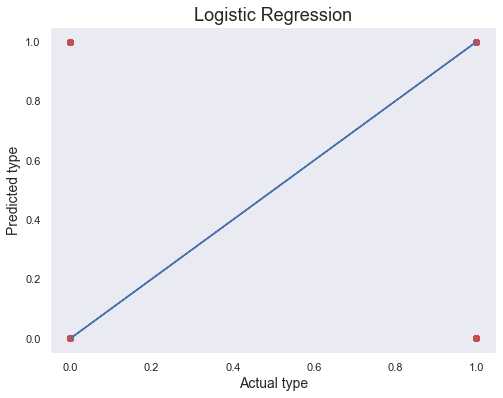

In [155]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=pred_lr, color='r')
plt.plot(y_test,y_test, color='b')
plt.xlabel('Actual type',fontsize=14)
plt.ylabel('Predicted type',fontsize=14)
plt.title('Logistic Regression',fontsize=18)
plt.show()

# plotting Auc-Roc curve..with logistic regression prediction..

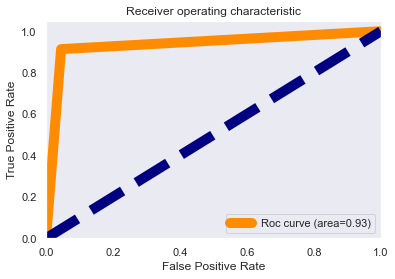

In [156]:
from sklearn.metrics import roc_curve,auc
    
fpr,tpr,threshold=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='Roc curve (area=%0.2f)'% roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
with logistic type..our models performs with accuracy 93%..

In [157]:
import numpy as np
a=np.array(ytest)
a

array([1.87, 1.33, 1.83, ..., 1.46, 1.55, 1.08])

In [160]:
predicted=np.array(pred_test)
predicted

array([1, 1, 1, ..., 1, 1, 1])

In [161]:
df_com=pd.DataFrame({"original":a,"predicted":predicted}, index= range(len(a)))

In [162]:
df_com

,original,predicted
0,1.87,1
1,1.33,1
2,1.83,1
3,1.78,0
4,1.43,0
...,...,...
3527,1.37,0
3528,1.07,1
3529,1.46,1
3530,1.55,1


# Conclusion

In [189]:
import numpy as np
a=np.array(ytest)
a

array([1.87, 1.33, 1.83, ..., 1.46, 1.55, 1.08])

In [190]:
predicted=np.array(pred_k)
predicted

array([2.04670837, 1.32180049, 1.72951716, ..., 1.2806114 , 1.49445203,
       1.0640244 ])

In [191]:
df_com=pd.DataFrame({"original":a,"predicted":predicted}, index= range(len(a)))

In [192]:
df_com

,original,predicted
0,1.87,2.046708
1,1.33,1.321800
2,1.83,1.729517
3,1.78,1.829832
4,1.43,1.452060
...,...,...
3527,1.37,1.239692
3528,1.07,1.010335
3529,1.46,1.280611
3530,1.55,1.494452


In [193]:
df_com.head(10)

,original,predicted
0,1.87,2.046708
1,1.33,1.321800
2,1.83,1.729517
3,1.78,1.829832
4,1.43,1.452060
5,1.38,1.297642
6,1.14,1.135214
7,1.62,1.523144
8,0.92,1.258138
9,1.66,1.289789


The best model is k-Neighbour regression as r2_score is best from above tested models.

Our Model performs with Accuracy 83.35%...

# Saving the best models with initials...using pickle library

In [195]:
import pickle
filename = 'avacado_price_prediction.pkl'
pickle.dump(kn, open(filename, 'wb'))